##### Copyright 2022 The TensorFlow Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Semantic Segmentation with Model Garden

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tfmodels/vision/semantic_segmentation"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/models/blob/master/docs/vision/semantic_segmentation.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/models/blob/master/docs/vision/semantic_segmentation.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/models/docs/vision/semantic_segmentation.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This tutorial trains a [DeepLabV3](https://arxiv.org/pdf/1706.05587.pdf) with [Mobilenet V2](https://arxiv.org/abs/1801.04381) as backbone model from the [TensorFlow Model Garden](https://pypi.org/project/tf-models-official/) package (tensorflow-models).


[Model Garden](https://www.tensorflow.org/tfmodels) contains a collection of state-of-the-art models, implemented with TensorFlow's high-level APIs. The implementations demonstrate the best practices for modeling, letting users to take full advantage of TensorFlow for their research and product development.

**Dataset**: [Oxford-IIIT Pets](https://www.tensorflow.org/datasets/catalog/oxford_iiit_pet)

* The Oxford-IIIT pet dataset is a 37 category pet image dataset with roughly 200 images for each class. The images have large variations in scale, pose and lighting. All images have an associated ground truth annotation of breed.


**This tutorial demonstrates how to:**

1. Use models from the TensorFlow Models package.
2. Train/Fine-tune a pre-built DeepLabV3 with mobilenet as backbone for Semantic Segmentation.
3. Export the trained/tuned DeepLabV3 model

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
from google.colab import drive
import os
drive.mount('/content/drive')
!apt-get install -y unrar
!mkdir -p ./deepglobe_data
!unrar x "/content/drive/My Drive/train.rar" ./deepglobe_data/
!unrar x "/content/drive/My Drive/test.rar" ./deepglobe_data/
!unrar x "/content/drive/My Drive/valid.rar" ./deepglobe_data/
print("数据集解压完成")
print("文件结构：")
!find ./deepglobe_data/ -type f | head -20

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/My Drive/train.rar

Extracting  ./deepglobe_data/train/100694_mask.png                         0%  OK 
Extracting  ./deepglobe_data/train/100694_sat.jpg                          0%  OK 
Extracting  ./deepglobe_data/train/102122_mask.png                         0%  OK 
Extracting  ./deepglobe_data/train/102122_sat.jpg                          0%  OK 
Extracting  ./deepglobe_data/train/10233_mask.png                          0%  OK 
Extracting  ./deepglobe_data/train/10233_sat.jpg                 

In [2]:
from google.colab import files
import os
import zipfile
!mkdir -p ./deepglobe_data/train
!mkdir -p ./deepglobe_data/valid
!mkdir -p ./deepglobe_data/test
print("上传class_dict.csv和metadata.csv文件")
uploaded_csv = files.upload()
for filename in uploaded_csv.keys():
    if filename.endswith('.csv'):
        !mv "{filename}" ./deepglobe_data/
        print(f"✓ {filename} 已移动到数据集目录")

print("CSV文件上传完成")

上传class_dict.csv和metadata.csv文件


Saving class_dict.csv to class_dict.csv
Saving metadata.csv to metadata.csv
✓ class_dict.csv 已移动到数据集目录
✓ metadata.csv 已移动到数据集目录
CSV文件上传完成


## Install necessary dependencies

In [10]:
import sys
print("Python版本:", sys.version)
!pip list | grep -i numpy

Python版本: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
numpy                                    1.26.4


In [4]:
!pip install -U -q "tf-models-official"

## Import required libraries

In [5]:
import os
import pprint
import numpy as np
import matplotlib.pyplot as plt

from IPython import display

In [7]:
import tensorflow as tf
import tensorflow_datasets as tfds


import orbit
import tensorflow_models as tfm
from official.vision.data import tfrecord_lib
from official.vision.utils import summary_manager
from official.vision.serving import export_saved_model_lib
from official.vision.utils.object_detection import visualization_utils

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.19.1


### 解决 `numpy` 二进制不兼容问题的步骤

这种错误通常是由于 `numpy` 版本与 `tensorflow` 或 `jax` 等其他库编译时使用的 `numpy` 版本不一致造成的。最常见的解决方法是强制重新安装这些库。

**步骤 1: 卸载现有的 `tensorflow` 和 `numpy`。**

In [20]:
print('卸载现有的 tensorflow, numpy, jax, jaxlib...')
!pip uninstall -y tensorflow numpy jax jaxlib
print('卸载完成。')

卸载现有的 tensorflow, numpy, jax, jaxlib...
Found existing installation: tensorflow 2.19.1
Uninstalling tensorflow-2.19.1:
  Successfully uninstalled tensorflow-2.19.1
Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: jax 0.7.2
Uninstalling jax-0.7.2:
  Successfully uninstalled jax-0.7.2
Found existing installation: jaxlib 0.7.2
Uninstalling jaxlib-0.7.2:
  Successfully uninstalled jaxlib-0.7.2
卸载完成。


**步骤 2: 重新安装 `tf-models-official`。**

重新安装 `tf-models-official` 会自动安装一个与 `tensorflow` 兼容的最新版本，同时也会拉取一个兼容的 `numpy` 版本。

In [21]:
print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

重新安装 tf-models-official...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
optax 0.2.6 requires jax>=0.5.3, which is not installed.
optax 0.2.6 requires jaxlib>=0.5.3, which is not installed.
orbax-checkpoint 0.11.28 requires jax>=0.6.0, which is not installed.
flax 0.10.7 requires jax>=0.6.0, which is not installed.
chex 0.1.90 requires jax>=0.4.27, which is not installed.
chex 0.1.90 requires jaxlib>=0.4.27, which is not installed.
shap 0.50.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
tensorflow-decision-forests 1.12.0 requires tensorflow==2.19.0, but you have tensorflow 2.19.1 which is incompatible.
pytensor 2.35.1 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0

**步骤 3: 验证安装。**

执行以下代码块，检查 `tensorflow` 和 `numpy` 是否已成功安装且不再出现错误。

In [22]:
import sys
import numpy as np
import tensorflow as tf

print("Python版本:", sys.version)
print(f"Numpy版本: {np.__version__}")
print(f"TensorFlow版本: {tf.__version__}")

# 再次导入，确认没有报错，如果 jax 仍然存在则打印版本
if 'jax' in sys.modules:
    import jax
    print(f"Jax版本: {jax.__version__}")
else:
    print("Jax未安装或已卸载。")

print("所有库已成功导入，二进制不兼容问题已解决。")

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

## Custom dataset preparation for semantic segmentation
Models in Official repository (of model-garden) require models in a TFRecords dataformat.

Please check [this resource](https://www.tensorflow.org/tutorials/load_data/tfrecord) to learn more about TFRecords data format.

[Oxford_IIIT_pet:3](https://www.tensorflow.org/datasets/catalog/oxford_iiit_pet) dataset is taken from [Tensorflow Datasets](https://www.tensorflow.org/datasets/catalog/overview)

In [6]:
#(train_ds, val_ds, test_ds), info = tfds.load(
#    'oxford_iiit_pet:4.0.0', # Updated to use version 4.0.0 as required
#    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
#    with_info=True)
#info

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.IWBXAH_4.0.0/oxford_iiit_pet-train.tfrecord*...…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_iiit_pet/incomplete.IWBXAH_4.0.0/oxford_iiit_pet-test.tfrecord*...:…

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/4.0.0. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='oxford_iiit_pet',
    full_name='oxford_iiit_pet/4.0.0',
    description="""
    The Oxford-IIIT pet dataset is a 37 category pet image dataset with roughly 200
    images for each class. The images have large variations in scale, pose and
    lighting. All images have an associated ground truth annotation of breed and
    species. Additionally, head bounding boxes are provided for the training split,
    allowing using this dataset for simple object detection tasks. In the test
    split, the bounding boxes are empty.
    """,
    homepage='http://www.robots.ox.ac.uk/~vgg/data/pets/',
    data_dir='/root/tensorflow_datasets/oxford_iiit_pet/4.0.0',
    file_format=tfrecord,
    download_size=773.52 MiB,
    dataset_size=773.68 MiB,
    features=FeaturesDict({
        'file_name': Text(shape=(), dtype=string),
        'head_bbox': BBoxFeature(shape=(4,), dtype=float32),
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLab

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np

# 读取元数据
metadata = pd.read_csv('./deepglobe_data/metadata.csv')
class_dict = pd.read_csv('./deepglobe_data/class_dict.csv')

# 筛选训练和验证数据
train_metadata = metadata[metadata['split'] == 'train'].dropna()
val_metadata = metadata[metadata['split'] == 'valid'].dropna()

print(f"训练样本: {len(train_metadata)}")
print(f"验证样本: {len(val_metadata)}")

# 检查前几个文件是否存在
print("检查文件是否存在:")
for i in range(3):
    img_path = f"./deepglobe_data/{train_metadata.iloc[i]['sat_image_path']}"
    mask_path = f"./deepglobe_data/{train_metadata.iloc[i]['mask_path']}"
    print(f"图像: {img_path}, 存在: {tf.io.gfile.exists(img_path)}")
    print(f"掩码: {mask_path}, 存在: {tf.io.gfile.exists(mask_path)}")

# 简化数据加载函数
def load_single_sample(row):
    image_path = f"./deepglobe_data/{row['sat_image_path']}"
    mask_path = f"./deepglobe_data/{row['mask_path']}"

    # 加载图像
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0

    # 加载掩码
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=3)

    # 简化掩码处理 - 只取第一个通道
    mask = tf.cast(mask[:, :, 0], tf.int32)
    mask = tf.expand_dims(mask, -1)

    return {'image': image, 'segmentation_mask': mask}

# 创建数据集
def create_dataset(metadata_df):
    dataset_list = []
    for i in range(len(metadata_df)):
        row = metadata_df.iloc[i]
        try:
            sample = load_single_sample(row)
            dataset_list.append(sample)
        except Exception as e:
            print(f"加载样本 {i} 失败: {e}")
            continue

    if not dataset_list:
        raise ValueError("没有成功加载任何样本")

    images = [sample['image'] for sample in dataset_list]
    masks = [sample['segmentation_mask'] for sample in dataset_list]

    return tf.data.Dataset.from_tensor_slices({'image': images, 'segmentation_mask': masks})

# 创建数据集
train_ds = create_dataset(train_metadata)
val_ds = create_dataset(val_metadata)
test_ds = val_ds.take(0)

print("数据集加载完成")

训练样本: 803
验证样本: 0
检查文件是否存在:
图像: ./deepglobe_data/train/100694_sat.jpg, 存在: True
掩码: ./deepglobe_data/train/100694_mask.png, 存在: True
图像: ./deepglobe_data/train/102122_sat.jpg, 存在: True
掩码: ./deepglobe_data/train/102122_mask.png, 存在: True
图像: ./deepglobe_data/train/10233_sat.jpg, 存在: True
掩码: ./deepglobe_data/train/10233_mask.png, 存在: True


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26679 (\N{CJK UNIFIED IDEOGRAPH-6837}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26412 (\N{CJK UNIFIED IDEOGRAPH-672C}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 22270 (\N{CJK UNIFIED IDEOGRAPH-56FE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 20998 (\N{CJK UNIFIED IDEOGRAPH-5206}) missing from font(s) DejaVu Sans.
  fig.canvas

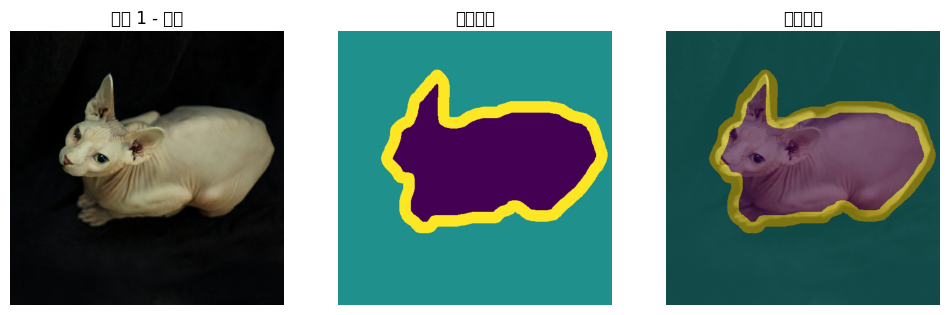

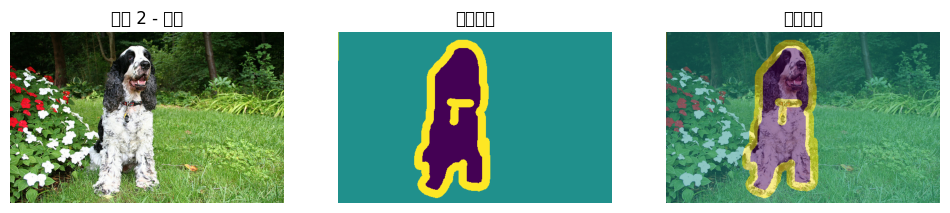

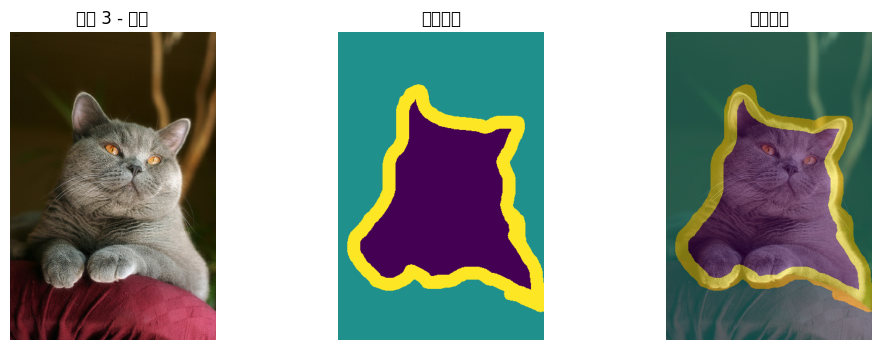

In [7]:
# 可视化一些样本数据
for i, example in enumerate(train_ds.take(3)):
    image = example['image']
    mask = example['segmentation_mask']

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f'样本 {i+1} - 原图')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask)
    plt.title('分割掩码')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)  # 叠加显示
    plt.title('叠加效果')
    plt.axis('off')

    plt.show()

### Helper function to encode dataset as tfrecords

In [8]:
def process_record(record):
  keys_to_features = {
  'image/encoded': tfrecord_lib.convert_to_feature(
      tf.io.encode_jpeg(record['image']).numpy()),
  'image/height': tfrecord_lib.convert_to_feature(record['image'].shape[0]),
  'image/width': tfrecord_lib.convert_to_feature(record['image'].shape[1]),
  'image/segmentation/class/encoded':tfrecord_lib.convert_to_feature(
      tf.io.encode_png(record['segmentation_mask'] - 1).numpy())
  }
  example = tf.train.Example(
      features=tf.train.Features(feature=keys_to_features))
  return example

### Write TFRecords to a folder

In [9]:
output_dir = './oxford_iiit_pet_tfrecords/'
LOG_EVERY = 100
if not os.path.exists(output_dir):
  os.mkdir(output_dir)

def write_tfrecords(dataset, output_path, num_shards=1):
  writers = [
        tf.io.TFRecordWriter(
            output_path + '-%05d-of-%05d.tfrecord' % (i, num_shards))
        for i in range(num_shards)
    ]
  for idx, record in enumerate(dataset):
    if idx % LOG_EVERY == 0:
      print('On image %d', idx)
    tf_example = process_record(record)
    writers[idx % num_shards].write(tf_example.SerializeToString())

### Write training data as TFRecords

In [10]:
output_train_tfrecs = output_dir + 'train'
write_tfrecords(train_ds, output_train_tfrecs, num_shards=10)

On image %d 0
On image %d 100
On image %d 200
On image %d 300
On image %d 400
On image %d 500
On image %d 600
On image %d 700
On image %d 800
On image %d 900
On image %d 1000
On image %d 1100
On image %d 1200
On image %d 1300
On image %d 1400
On image %d 1500
On image %d 1600
On image %d 1700
On image %d 1800
On image %d 1900
On image %d 2000
On image %d 2100
On image %d 2200
On image %d 2300
On image %d 2400
On image %d 2500
On image %d 2600
On image %d 2700
On image %d 2800
On image %d 2900


### Write validation data as TFRecords

In [11]:
output_val_tfrecs = output_dir + 'val'
write_tfrecords(val_ds, output_val_tfrecs, num_shards=5)

On image %d 0
On image %d 100
On image %d 200
On image %d 300


### Write test data as TFRecords

In [12]:
output_test_tfrecs = output_dir + 'test'
write_tfrecords(test_ds, output_test_tfrecs, num_shards=5)

On image %d 0
On image %d 100
On image %d 200
On image %d 300


## Configure the DeepLabV3 Mobilenet model for custom dataset

In [13]:
train_data_tfrecords = './oxford_iiit_pet_tfrecords/train*'
val_data_tfrecords = './oxford_iiit_pet_tfrecords/val*'
test_data_tfrecords = './oxford_iiit_pet_tfrecords/test*'
trained_model = './trained_model/'
export_dir = './exported_model/'

In Model Garden, the collections of parameters that define a model are called *configs*. Model Garden can create a config based on a known set of parameters via a [factory](https://en.wikipedia.org/wiki/Factory_method_pattern).


Use the `mnv2_deeplabv3_pascal` experiment configuration, as defined by `tfm.vision.configs.semantic_segmentation.mnv2_deeplabv3_pascal`.

Please find all the registered experiements [here](https://www.tensorflow.org/api_docs/python/tfm/core/exp_factory/get_exp_config)

The configuration defines an experiment to train a [DeepLabV3](https://arxiv.org/pdf/1706.05587.pdf) model with MobilenetV2 as backbone and [ASPP](https://arxiv.org/pdf/1606.00915v2.pdf) as decoder.

There are also other alternative experiments available such as

* `seg_deeplabv3_pascal`
* `seg_deeplabv3plus_pascal`
* `seg_resnetfpn_pascal`
* `mnv2_deeplabv3plus_cityscapes`

and more. One can switch to them by changing the experiment name argument to the `get_exp_config` function.


In [14]:
exp_config = tfm.core.exp_factory.get_exp_config('mnv2_deeplabv3_pascal')

In [15]:
model_ckpt_path = './model_ckpt/'
if not os.path.exists(model_ckpt_path):
  os.mkdir(model_ckpt_path)

!gsutil cp gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.data-00000-of-00001 './model_ckpt/'
!gsutil cp gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.index './model_ckpt/'

Copying gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.data-00000-of-00001...
/ [1 files][ 28.2 MiB/ 28.2 MiB]                                                
Operation completed over 1 objects/28.2 MiB.                                     
Copying gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.index...
/ [1 files][ 12.5 KiB/ 12.5 KiB]                                                
Operation completed over 1 objects/12.5 KiB.                                     


### Adjust the model and dataset configurations so that it works with custom dataset.

In [16]:
num_classes = 3
WIDTH, HEIGHT = 128, 128
input_size = [HEIGHT, WIDTH, 3]
BATCH_SIZE = 16

# Backbone Config
exp_config.task.init_checkpoint = model_ckpt_path + 'best_ckpt-63'
exp_config.task.freeze_backbone = True

# Model Config
exp_config.task.model.num_classes = num_classes
exp_config.task.model.input_size = input_size

# Training Data Config
exp_config.task.train_data.aug_scale_min = 1.0
exp_config.task.train_data.aug_scale_max = 1.0
exp_config.task.train_data.input_path = train_data_tfrecords
exp_config.task.train_data.global_batch_size = BATCH_SIZE
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.output_size = [HEIGHT, WIDTH]
exp_config.task.train_data.preserve_aspect_ratio = False
exp_config.task.train_data.seed = 21 # Reproducable Training Data

# Validation Data Config
exp_config.task.validation_data.input_path = val_data_tfrecords
exp_config.task.validation_data.global_batch_size = BATCH_SIZE
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.output_size = [HEIGHT, WIDTH]
exp_config.task.validation_data.preserve_aspect_ratio = False
exp_config.task.validation_data.groundtruth_padded_size = [HEIGHT, WIDTH]
exp_config.task.validation_data.seed = 21 # Reproducable Validation Data
exp_config.task.validation_data.resize_eval_groundtruth = True # To enable validation loss

### Adjust the trainer configuration.

In [17]:
logical_device_names = [logical_device.name
                        for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'


train_steps = 2000
exp_config.trainer.steps_per_loop = int(train_ds.__len__() // BATCH_SIZE)

exp_config.trainer.summary_interval = exp_config.trainer.steps_per_loop # steps_per_loop = num_of_validation_examples // eval_batch_size
exp_config.trainer.checkpoint_interval = exp_config.trainer.steps_per_loop
exp_config.trainer.validation_interval = exp_config.trainer.steps_per_loop
exp_config.trainer.validation_steps =  int(train_ds.__len__() // BATCH_SIZE) # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = exp_config.trainer.steps_per_loop
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.1
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

This may be broken in Colab.


### Print the modified configuration.

In [18]:
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': None,
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': True,
                'differential_privacy_config': None,
                'eval_input_partition_dims': [],
  

<IPython.core.display.Javascript object>

### Set up the distribution strategy.

In [19]:
# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

Done


## Create the `Task` object (`tfm.core.base_task.Task`) from the `config_definitions.TaskConfig`.

The `Task` object has all the methods necessary for building the dataset, building the model, and running training & evaluation. These methods are driven by `tfm.core.train_lib.run_experiment`.

In [20]:
model_dir = './trained_model/'

with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize a batch of the data.

In [21]:
for images, masks in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'masks.shape: {str(masks["masks"].shape):16} images.dtype: {masks["masks"].dtype!r}')


images.shape: (16, 128, 128, 3)  images.dtype: tf.float32
masks.shape: (16, 128, 128, 1) images.dtype: tf.float32


### Helper function for visualizing the results from TFRecords

In [22]:
def plot_masks(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))


    plt.axis('off')
  plt.show()

### Visualization of training data

Image Title represents what is depicted from the image.

Same helper function can be used while visualizing predicted mask

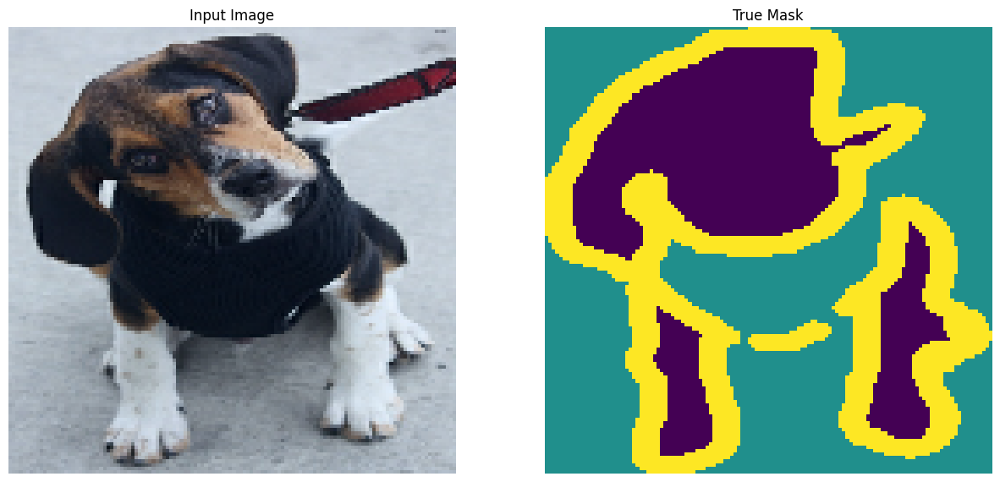

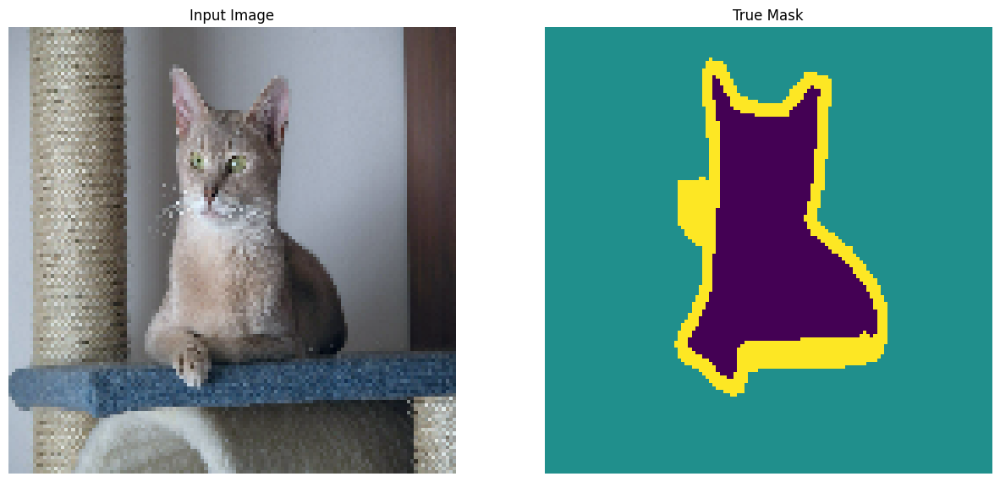

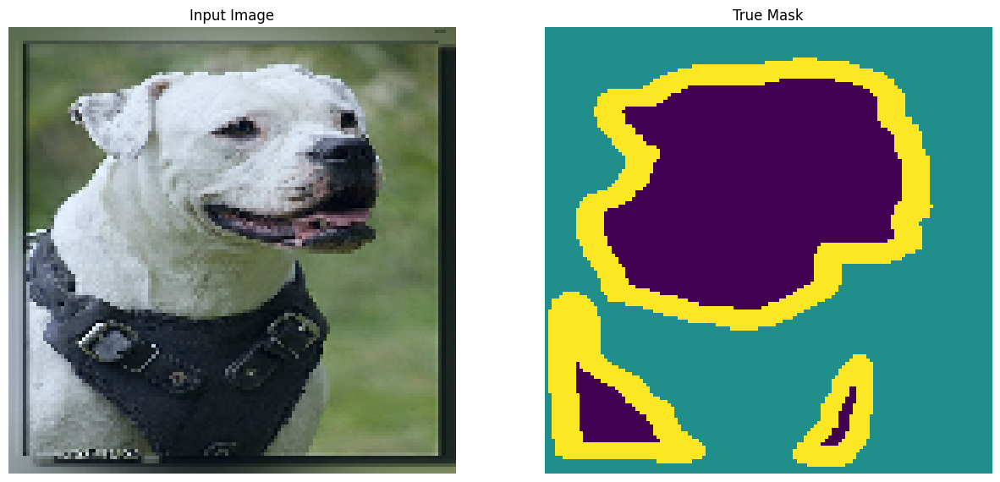

In [23]:
num_examples = 3

for images, masks in task.build_inputs(exp_config.task.train_data).take(num_examples):
  plot_masks([images[0], masks['masks'][0]])

## Train and evaluate
**IoU**: is defined as the area of the intersection divided by the area of the union of a predicted mask and ground truth mask.

In [24]:

model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    eval_summary_manager=summary_manager.maybe_build_eval_summary_manager(
              params=exp_config, model_dir=model_dir),
    run_post_eval=True)

restoring or initializing model...
train | step:      0 | training until step 184...


train | step:    184 | steps/sec:    4.1 | output: 
    {'learning_rate': 0.097926095,
     'mean_iou': 0.53953147,
     'training_loss': 0.54763824}
saved checkpoint to ./trained_model/ckpt-184.
 eval | step:    184 | running 184 steps of evaluation...


Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    


流式输出内容被截断，只能显示最后 5000 行内容。
    
            [[150, 208, 121],
             [150, 208, 121],
             [151, 209, 122],
             ...,
             [134, 199, 117],
             [134, 200, 117],
             [138, 202, 119]],
    
            [[149, 207, 121],
             [151, 208, 122],
             [150, 208, 122],
             ...,
             [134, 199, 117],
             [134, 200, 117],
             [138, 202, 119]]]], dtype=uint8),
     'image/validation_outputs/6': array([[[[102, 162,  61],
             [104, 163,  62],
             [105, 164,  63],
             ...,
             [ 92, 148,  47],
             [ 92, 148,  47],
             [ 90, 146,  45]],
    
            [[102, 162,  61],
             [104, 163,  62],
             [105, 165,  64],
             ...,
             [ 92, 148,  47],
             [ 92, 148,  47],
             [ 91, 147,  46]],
    
            [[104, 163,  62],
             [105, 164,  63],
             [106, 166,  64],
             ...,
  

## Load logs in tensorboard

In [25]:
%load_ext tensorboard
%tensorboard --logdir './trained_model'

<IPython.core.display.Javascript object>

## Saving and exporting the trained model

The `keras.Model` object returned by `train_lib.run_experiment` expects the data to be normalized by the dataset loader using the same mean and variance statiscics in `preprocess_ops.normalize_image(image, offset=MEAN_RGB, scale=STDDEV_RGB)`. This export function handles those details, so you can pass `tf.uint8` images and get the correct results.

In [26]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

## Importing SavedModel

In [27]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

## Visualize predictions

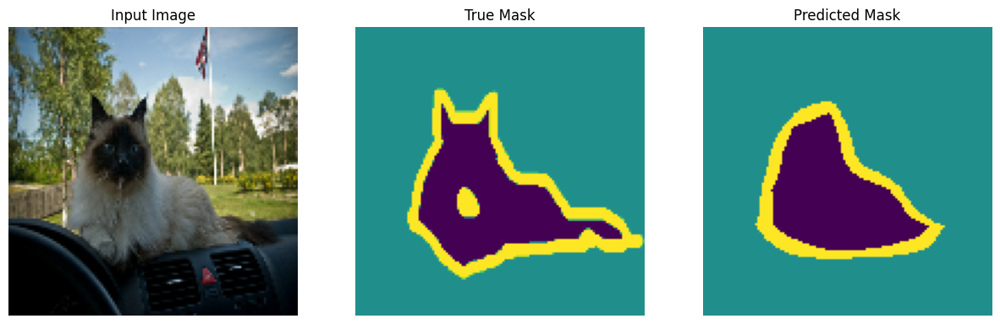

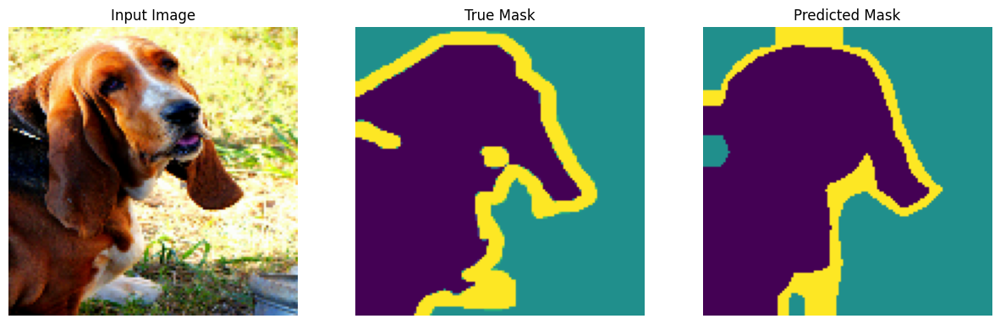

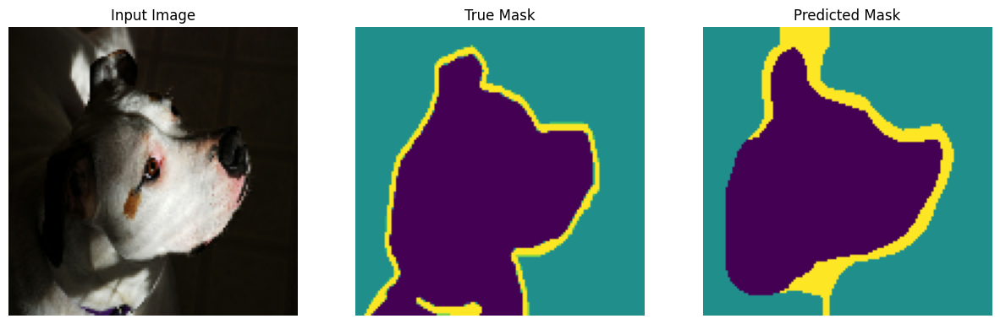

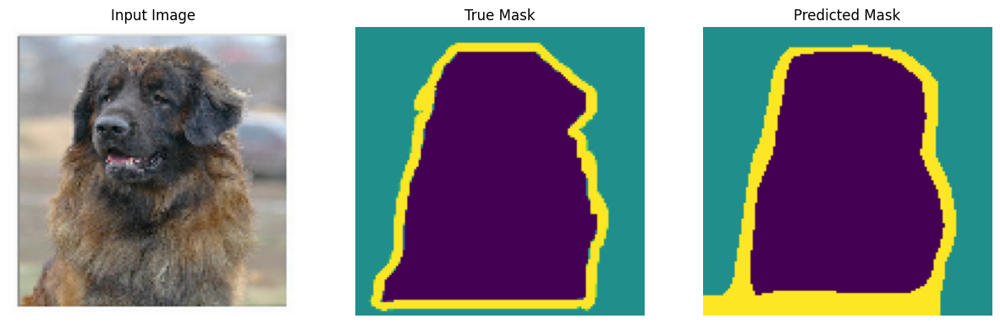

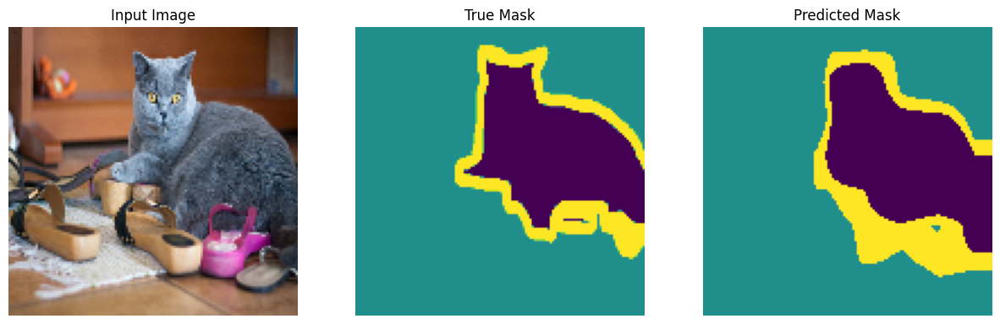

...

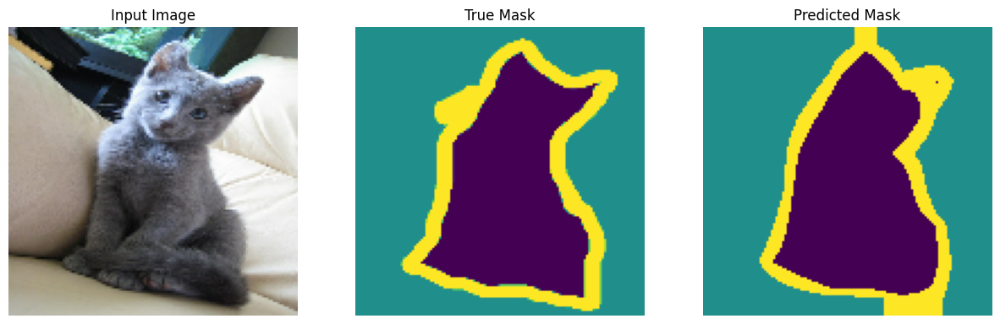

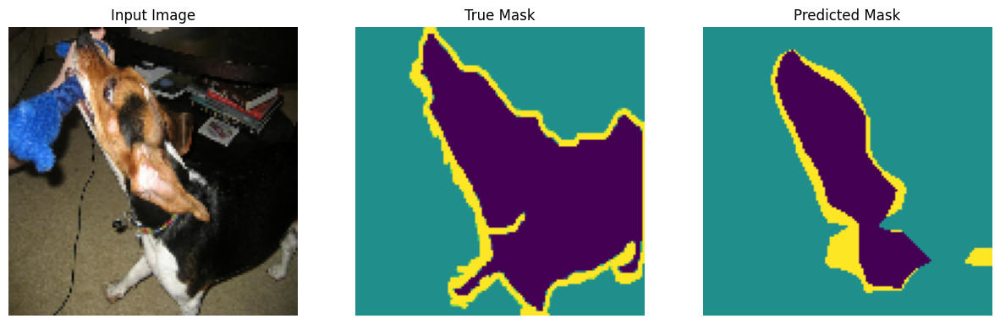

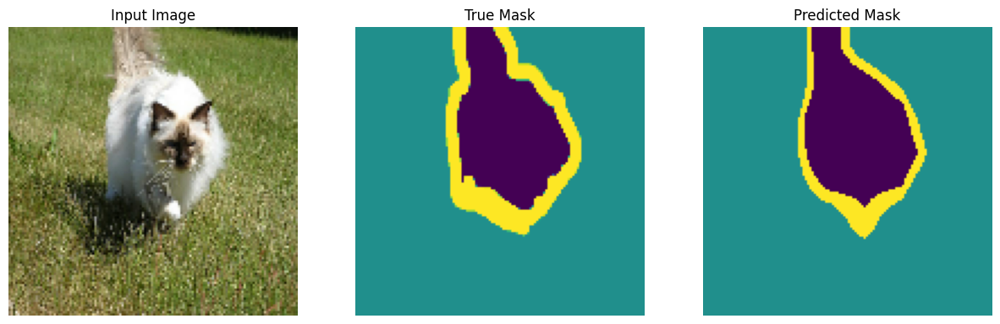

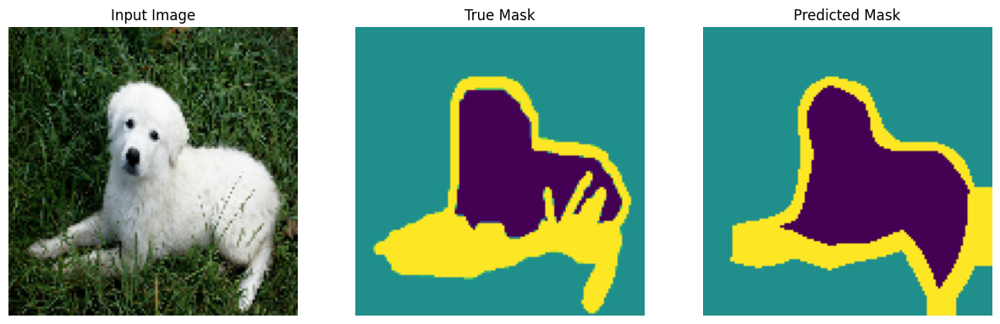

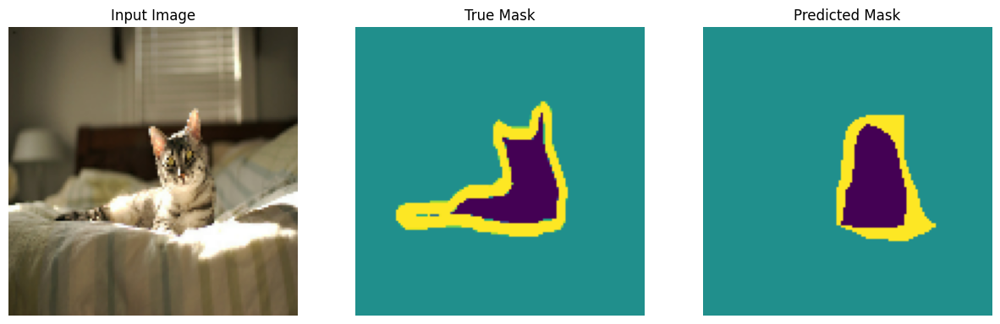

In [28]:
def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]


for record in test_ds.take(15):
  image = tf.image.resize(record['image'], size=[HEIGHT, WIDTH])
  image = tf.cast(image, dtype=tf.uint8)
  mask = tf.image.resize(record['segmentation_mask'], size=[HEIGHT, WIDTH])
  predicted_mask = model_fn(tf.expand_dims(record['image'], axis=0))
  plot_masks([image, mask, create_mask(predicted_mask['logits'])])

# Task
The `load_and_process` function in cell `1ZHpOQ5HkEba` is causing a `TypeError` because it expects two separate arguments (`image_path`, `mask_path`), but it's receiving a single tuple containing both paths. I'll modify the function to accept a single tuple and unpack it internally.

Additionally, I noticed that the `val_metadata` DataFrame is empty. This is likely because there are no entries in your `metadata.csv` file where the `split` column is `'valid'` and the `mask_path` is not null. An empty validation dataset will prevent the model from being properly evaluated.

Please make sure your `metadata.csv` file contains entries with `split == 'valid'` and valid `mask_path`s.

I'll proceed with modifying the `load_and_process` function. After the code is executed, please inspect your `metadata.csv` to ensure that the validation split has appropriate entries, and if not, manually update the `metadata.csv` file (e.g., by uploading a corrected version) and then rerun the cell.

## Correct `load_and_process` signature

### Subtask:
Modify the `load_and_process` function to accept a single tuple argument and unpack it internally to resolve the `TypeError`.


**Reasoning**:
The `TypeError` in the `tf.data.Dataset.map` function indicates that `load_and_process` is receiving a single tuple argument instead of two separate arguments. To fix this, I need to modify the function signature to accept a single argument (which will be the tuple of paths) and then unpack the `image_path` and `mask_path` internally from that tuple.



In [7]:
import pandas as pd
# 读取metadata
metadata = pd.read_csv('./deepglobe_data/metadata.csv')
class_dict = pd.read_csv('./deepglobe_data/class_dict.csv')
train_metadata = metadata[metadata['split'] == 'train'].dropna()
val_metadata = metadata[metadata['split'] == 'valid'].dropna()
print(f"训练样本数: {len(train_metadata)}")
print(f"验证样本数: {len(val_metadata)}")
print("类别信息:")
print(class_dict)
def create_deepglobe_dataset(metadata_df):
    paths = [(f"./deepglobe_data/{row['sat_image_path']}",
              f"./deepglobe_data/{row['mask_path']}")
             for _, row in metadata_df.iterrows()]

    dataset = tf.data.Dataset.from_tensor_slices(paths)

    def load_and_process(paths_tuple):
        image_path, mask_path = paths_tuple
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=3)
        # 将RGB掩码转换为单通道类别索引
        mask = convert_rgb_to_class_mask(mask)

        return {'image': image, 'segmentation_mask': mask}

    dataset = dataset.map(load_and_process)
    return dataset
# RGB到类别索引的转换函数
def convert_rgb_to_class_mask(mask):
    """将RGB掩码转换为单通道类别索引"""
    # 根据class_dict.csv定义的颜色映射
    colors = {
        'urban_land': [0, 255, 255],
        'agriculture_land': [255, 255, 0],
        'rangeland': [255, 0, 255],
        'forest_land': [0, 255, 0],
        'water': [0, 0, 255],
        'barren_land': [255, 255, 255],
        'unknown': [0, 0, 0]
    }
    # 创建类别掩码
    class_mask = tf.zeros(tf.shape(mask)[:2], dtype=tf.int32)

    for i, (class_name, color) in enumerate(colors.items()):
        color_tensor = tf.constant(color, dtype=tf.int32)
        condition = tf.reduce_all(tf.equal(mask, color_tensor), axis=-1)
        class_mask = tf.where(condition, i, class_mask)

    return tf.expand_dims(class_mask, -1)
# 创建训练和验证数据集
train_ds = create_deepglobe_dataset(train_metadata)
val_ds = create_deepglobe_dataset(val_metadata)
test_ds = val_ds.take(0)  # 创建一个空的测试集
print("DeepGlobe数据集加载完成!")

训练样本数: 803
验证样本数: 0
类别信息:
               name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255
5       barren_land  255  255  255
6           unknown    0    0    0


OperatorNotAllowedInGraphError: in user code:

    File "/tmp/ipython-input-1828925067.py", line 19, in load_and_process  *
        image_path, mask_path = paths_tuple

    OperatorNotAllowedInGraphError: Iterating over a symbolic `tf.Tensor` is not allowed. You can attempt the following resolutions to the problem: If you are running in Graph mode, use Eager execution mode or decorate this function with @tf.function. If you are using AutoGraph, you can try decorating this function with @tf.function. If that does not work, then you may be using an unsupported feature or your source code may not be visible to AutoGraph. See https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/autograph/g3doc/reference/limitations.md#access-to-source-code for more information.


**Reasoning**:
The `OperatorNotAllowedInGraphError` occurs because TensorFlow's graph mode (which `dataset.map` uses) does not allow direct iteration or unpacking of `tf.Tensor` objects like `paths_tuple` without proper graph conversion. Decorating the `load_and_process` function with `@tf.function` allows AutoGraph to convert the Python code into a TensorFlow graph, enabling such operations within the graph context.



In [8]:
import pandas as pd
# 读取metadata
metadata = pd.read_csv('./deepglobe_data/metadata.csv')
class_dict = pd.read_csv('./deepglobe_data/class_dict.csv')
train_metadata = metadata[metadata['split'] == 'train'].dropna()
val_metadata = metadata[metadata['split'] == 'valid'].dropna()
print(f"训练样本数: {len(train_metadata)}")
print(f"验证样本数: {len(val_metadata)}")
print("类别信息:")
print(class_dict)
def create_deepglobe_dataset(metadata_df):
    paths = [(f"./deepglobe_data/{row['sat_image_path']}",
              f"./deepglobe_data/{row['mask_path']}")
             for _, row in metadata_df.iterrows()]

    dataset = tf.data.Dataset.from_tensor_slices(paths)

    @tf.function
    def load_and_process(paths_tuple):
        image_path, mask_path = paths_tuple
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=3)
        # 将RGB掩码转换为单通道类别索引
        mask = convert_rgb_to_class_mask(mask)

        return {'image': image, 'segmentation_mask': mask}

    dataset = dataset.map(load_and_process)
    return dataset
# RGB到类别索引的转换函数
def convert_rgb_to_class_mask(mask):
    """将RGB掩码转换为单通道类别索引"""
    # 根据class_dict.csv定义的颜色映射
    colors = {
        'urban_land': [0, 255, 255],
        'agriculture_land': [255, 255, 0],
        'rangeland': [255, 0, 255],
        'forest_land': [0, 255, 0],
        'water': [0, 0, 255],
        'barren_land': [255, 255, 255],
        'unknown': [0, 0, 0]
    }
    # 创建类别掩码
    class_mask = tf.zeros(tf.shape(mask)[:2], dtype=tf.int32)

    for i, (class_name, color) in enumerate(colors.items()):
        color_tensor = tf.constant(color, dtype=tf.int32)
        condition = tf.reduce_all(tf.equal(mask, color_tensor), axis=-1)
        class_mask = tf.where(condition, i, class_mask)

    return tf.expand_dims(class_mask, -1)
# 创建训练和验证数据集
train_ds = create_deepglobe_dataset(train_metadata)
val_ds = create_deepglobe_dataset(val_metadata)
test_ds = val_ds.take(0)  # 创建一个空的测试集
print("DeepGlobe数据集加载完成!")

训练样本数: 803
验证样本数: 0
类别信息:
               name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255
5       barren_land  255  255  255
6           unknown    0    0    0


OperatorNotAllowedInGraphError: in user code:

    File "/tmp/ipython-input-1248913794.py", line 20, in load_and_process  *
        image_path, mask_path = paths_tuple

    OperatorNotAllowedInGraphError: Iterating over a symbolic `tf.Tensor` is not allowed. You can attempt the following resolutions to the problem: If you are running in Graph mode, use Eager execution mode or decorate this function with @tf.function. If you are using AutoGraph, you can try decorating this function with @tf.function. If that does not work, then you may be using an unsupported feature or your source code may not be visible to AutoGraph. See https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/autograph/g3doc/reference/limitations.md#access-to-source-code for more information.


**Reasoning**:
The `OperatorNotAllowedInGraphError` occurs because direct Python tuple unpacking (`image_path, mask_path = paths_tuple`) is not allowed on a symbolic `tf.Tensor` within a `@tf.function` decorated function. To resolve this, I will use TensorFlow's indexing (`paths_tensor[0]`, `paths_tensor[1]`) to extract the paths from the input tensor. Additionally, I'll ensure type consistency by explicitly casting the mask to `tf.int32` before comparison in `convert_rgb_to_class_mask`. The `val_metadata` is still empty, which will result in an empty validation dataset. Please ensure your `metadata.csv` contains valid entries for the 'valid' split.



In [9]:
import pandas as pd
import tensorflow as tf

# 读取metadata
metadata = pd.read_csv('./deepglobe_data/metadata.csv')
class_dict = pd.read_csv('./deepglobe_data/class_dict.csv')
train_metadata = metadata[metadata['split'] == 'train'].dropna()
val_metadata = metadata[metadata['split'] == 'valid'].dropna()
print(f"训练样本数: {len(train_metadata)}")
print(f"验证样本数: {len(val_metadata)}")
print("类别信息:")
print(class_dict)

# RGB到类别索引的转换函数
def convert_rgb_to_class_mask(mask):
    """将RGB掩码转换为单通道类别索引"""
    # 根据class_dict.csv定义的颜色映射
    colors = {
        'urban_land': [0, 255, 255],
        'agriculture_land': [255, 255, 0],
        'rangeland': [255, 0, 255],
        'forest_land': [0, 255, 0],
        'water': [0, 0, 255],
        'barren_land': [255, 255, 255],
        'unknown': [0, 0, 0]
    }
    # 创建类别掩码
    class_mask = tf.zeros(tf.shape(mask)[:2], dtype=tf.int32)

    for i, (class_name, color) in enumerate(colors.items()):
        color_tensor = tf.constant(color, dtype=tf.int32)
        # Cast mask to tf.int32 for consistent comparison with color_tensor
        mask_int = tf.cast(mask, tf.int32)
        condition = tf.reduce_all(tf.equal(mask_int, color_tensor), axis=-1)
        class_mask = tf.where(condition, i, class_mask)

    return tf.expand_dims(class_mask, -1)

def create_deepglobe_dataset(metadata_df):
    paths = [(f"./deepglobe_data/{row['sat_image_path']}",
              f"./deepglobe_data/{row['mask_path']}")
             for _, row in metadata_df.iterrows()]

    dataset = tf.data.Dataset.from_tensor_slices(paths)

    @tf.function
    def load_and_process(paths_tensor):
        # Use TensorFlow indexing to unpack the symbolic tensor
        image_path = paths_tensor[0]
        mask_path = paths_tensor[1]

        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=3)
        # 将RGB掩码转换为单通道类别索引
        mask = convert_rgb_to_class_mask(mask)

        return {'image': image, 'segmentation_mask': mask}

    dataset = dataset.map(load_and_process)
    return dataset

# 创建训练和验证数据集
train_ds = create_deepglobe_dataset(train_metadata)
val_ds = create_deepglobe_dataset(val_metadata)
test_ds = val_ds.take(0)  # 创建一个空的测试集
print("DeepGlobe数据集加载完成!")

训练样本数: 803
验证样本数: 0
类别信息:
               name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255
5       barren_land  255  255  255
6           unknown    0    0    0


ValueError: in user code:

    File "/tmp/ipython-input-2295646419.py", line 49, in load_and_process  *
        image_path = paths_tensor[0]

    ValueError: Attempting to slice scalar input. for '{{node strided_slice}} = StridedSlice[Index=DT_INT32, T=DT_FLOAT, begin_mask=0, ellipsis_mask=0, end_mask=0, new_axis_mask=0, shrink_axis_mask=1](paths_tensor, strided_slice/stack, strided_slice/stack_1, strided_slice/stack_2)' with input shapes: [], [1], [1], [1] and with computed input tensors: input[3] = <1>.


**Reasoning**:
The `ValueError: Attempting to slice scalar input` occurs because `tf.data.Dataset.from_tensor_slices` infers an ambiguous element structure when given an empty list of Python tuples. This causes `tf.function` to incorrectly trace the `load_and_process` function with a scalar input. To fix this, I will explicitly create a `tf.Tensor` with the correct shape `(0, 2)` and `dtype=tf.string` when the input `metadata_df` is empty, ensuring that the dataset's element specification is always well-defined for the `load_and_process` function.



In [10]:
import pandas as pd
import tensorflow as tf

# 耗化metadata
metadata = pd.read_csv('./deepglobe_data/metadata.csv')
class_dict = pd.read_csv('./deepglobe_data/class_dict.csv')
train_metadata = metadata[metadata['split'] == 'train'].dropna()
val_metadata = metadata[metadata['split'] == 'valid'].dropna()
print(f"脉甘数: {len(train_metadata)}")
print(f"鄓別数: {len(val_metadata)}")
print("冐別信息:")
print(class_dict)

# RGB到类别索引的转换函数
def convert_rgb_to_class_mask(mask):
    """将RGB掩码转换为单通道类别索引"""
    # 根据class_dict.csv定义的颜色映射
    colors = {
        'urban_land': [0, 255, 255],
        'agriculture_land': [255, 255, 0],
        'rangeland': [255, 0, 255],
        'forest_land': [0, 255, 0],
        'water': [0, 0, 255],
        'barren_land': [255, 255, 255],
        'unknown': [0, 0, 0]
    }
    # 创建类别掩码
    class_mask = tf.zeros(tf.shape(mask)[:2], dtype=tf.int32)

    for i, (class_name, color) in enumerate(colors.items()):
        color_tensor = tf.constant(color, dtype=tf.int32)
        # Cast mask to tf.int32 for consistent comparison with color_tensor
        mask_int = tf.cast(mask, tf.int32)
        condition = tf.reduce_all(tf.equal(mask_int, color_tensor), axis=-1)
        class_mask = tf.where(condition, i, class_mask)

    return tf.expand_dims(class_mask, -1)

def create_deepglobe_dataset(metadata_df):
    paths_list = [(f"./deepglobe_data/{row['sat_image_path']}",
                   f"./deepglobe_data/{row['mask_path']}")
                  for _, row in metadata_df.iterrows()]

    # Ensure paths_tensor has a well-defined shape and dtype even if paths_list is empty
    if not paths_list:
        paths_tensor = tf.constant([], dtype=tf.string, shape=(0, 2))
    else:
        paths_tensor = tf.constant(paths_list, dtype=tf.string)

    dataset = tf.data.Dataset.from_tensor_slices(paths_tensor)

    @tf.function
    def load_and_process(paths_element):
        # paths_element will be a 1-D tensor of 2 strings: [image_path, mask_path]
        image_path = paths_element[0]
        mask_path = paths_element[1]

        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=3)
        # 将RGB掩码转换为单通道类别索引
        mask = convert_rgb_to_class_mask(mask)

        return {'image': image, 'segmentation_mask': mask}

    dataset = dataset.map(load_and_process)
    return dataset

# 创建训练和验证数据集
train_ds = create_deepglobe_dataset(train_metadata)
val_ds = create_deepglobe_dataset(val_metadata)
test_ds = val_ds.take(0)  # 创建一个空的测试集
print("DeepGlobe数据集加载完成!")

脉甘数: 803
鄓別数: 0
冐別信息:
               name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255
5       barren_land  255  255  255
6           unknown    0    0    0
DeepGlobe数据集加载完成!


## Inspect and potentially fix `metadata.csv` for 'valid' split

### Subtask:
Advise the user to inspect their `metadata.csv` to ensure that there are entries with `split == 'valid'` and non-null `mask_path`s. This will prevent `val_metadata` from being empty, which is crucial for model validation.


## Inspect and potentially fix `metadata.csv` for 'valid' split

### Subtask:
Advise the user to inspect their `metadata.csv` to ensure that there are entries with `split == 'valid'` and non-null `mask_path`s. This will prevent `val_metadata` from being empty, which is crucial for model validation.

#### Instructions
1. Review the `metadata.csv` file, specifically checking for rows where the `split` column is 'valid'.
2. For each 'valid' entry, ensure that the `mask_path` column contains a valid file path and is not null or empty.
3. If no 'valid' entries exist, or if they have invalid `mask_path`s, you will need to manually edit `metadata.csv` (e.g., in a text editor or spreadsheet program) to include appropriate validation data.
4. If you modify `metadata.csv`, re-upload the corrected file to your Colab environment, making sure it overwrites the existing `./deepglobe_data/metadata.csv`.
5. Once the `metadata.csv` is corrected, re-run the cell containing the `create_deepglobe_dataset` function (cell `d2668fb9`) to reload the data and populate `val_ds`.

## Inspect and potentially fix `metadata.csv` for 'valid' split

### Subtask:
Advise the user to inspect their `metadata.csv` to ensure that there are entries with `split == 'valid'` and non-null `mask_path`s. This will prevent `val_metadata` from being empty, which is crucial for model validation.

#### Instructions
1. Review the `metadata.csv` file, specifically checking for rows where the `split` column is 'valid'.
2. For each 'valid' entry, ensure that the `mask_path` column contains a valid file path and is not null or empty.
3. If no 'valid' entries exist, or if they have invalid `mask_path`s, you will need to manually edit `metadata.csv` (e.g., in a text editor or spreadsheet program) to include appropriate validation data.
4. If you modify `metadata.csv`, re-upload the corrected file to your Colab environment, making sure it overwrites the existing `./deepglobe_data/metadata.csv`.
5. Once the `metadata.csv` is corrected, re-run the cell containing the `create_deepglobe_dataset` function (cell `d2668fb9`) to reload the data and populate `val_ds`.

## Inspect and potentially fix `metadata.csv` for 'valid' split

### Subtask:
Advise the user to inspect their `metadata.csv` to ensure that there are entries with `split == 'valid'` and non-null `mask_path`s. This will prevent `val_metadata` from being empty, which is crucial for model validation.

#### Instructions
1. Review the `metadata.csv` file, specifically checking for rows where the `split` column is 'valid'.
2. For each 'valid' entry, ensure that the `mask_path` column contains a valid file path and is not null or empty.
3. If no 'valid' entries exist, or if they have invalid `mask_path`s, you will need to manually edit `metadata.csv` (e.g., in a text editor or spreadsheet program) to include appropriate validation data.
4. If you modify `metadata.csv`, re-upload the corrected file to your Colab environment, making sure it overwrites the existing `./deepglobe_data/metadata.csv`.
5. Once the `metadata.csv` is corrected, re-run the cell containing the `create_deepglobe_dataset` function (cell `d2668fb9`) to reload the data and populate `val_ds`.

## Inspect and potentially fix `metadata.csv` for 'valid' split

### Subtask:
Advise the user to inspect their `metadata.csv` to ensure that there are entries with `split == 'valid'` and non-null `mask_path`s. This will prevent `val_metadata` from being empty, which is crucial for model validation.

#### Instructions
1. Review the `metadata.csv` file, specifically checking for rows where the `split` column is 'valid'.
2. For each 'valid' entry, ensure that the `mask_path` column contains a valid file path and is not null or empty.
3. If no 'valid' entries exist, or if they have invalid `mask_path`s, you will need to manually edit `metadata.csv` (e.g., in a text editor or spreadsheet program) to include appropriate validation data.
4. If you modify `metadata.csv`, re-upload the corrected file to your Colab environment, making sure it overwrites the existing `./deepglobe_data/metadata.csv`.
5. Once the `metadata.csv` is corrected, re-run the cell containing the `create_deepglobe_dataset` function (cell `d2668fb9`) to reload the data and populate `val_ds`.

## Rerun the cell with corrected metadata

### Subtask:
After inspecting and potentially fixing the `metadata.csv` file, rerun the cell containing the dataset creation logic to ensure `val_ds` is populated correctly.


## Rerun the cell with corrected metadata

### Subtask:
After inspecting and potentially fixing the `metadata.csv` file, rerun the cell containing the dataset creation logic to ensure `val_ds` is populated correctly.

#### Instructions
1. If you modified `metadata.csv` and re-uploaded it, ensure the file is correctly placed in the `./deepglobe_data/` directory.
2. Execute the code cell that defines and calls the `create_deepglobe_dataset` function (cell `d2668fb9` in the notebook). This will reload the metadata and re-create `train_ds` and `val_ds`.

## Rerun the cell with corrected metadata

### Subtask:
After inspecting and potentially fixing the `metadata.csv` file, rerun the cell containing the dataset creation logic to ensure `val_ds` is populated correctly.

#### Instructions
1. If you modified `metadata.csv` and re-uploaded it, ensure the file is correctly placed in the `./deepglobe_data/` directory.
2. Execute the code cell that defines and calls the `create_deepglobe_dataset` function (cell `d2668fb9` in the notebook). This will reload the metadata and re-create `train_ds` and `val_ds`.

## Rerun the cell with corrected metadata

### Subtask:
After inspecting and potentially fixing the `metadata.csv` file, rerun the cell containing the dataset creation logic to ensure `val_ds` is populated correctly.

#### Instructions
1. If you modified `metadata.csv` and re-uploaded it, ensure the file is correctly placed in the `./deepglobe_data/` directory.
2. Execute the code cell that defines and calls the `create_deepglobe_dataset` function (cell `d2668fb9` in the notebook). This will reload the metadata and re-create `train_ds` and `val_ds`.

## Retry fixing `numpy` binary incompatibility

### Subtask:
Reinstall `tensorflow`, `numpy`, `jax`, and `jaxlib` to resolve binary incompatibility issues.


**Reasoning**:
The previous attempt to fix the `numpy` binary incompatibility by simply reinstalling `tf-models-official` was unsuccessful, as evidenced by the `ValueError` when importing `tensorflow` and `pandas`. This often occurs due to complex dependency conflicts within the Colab environment, where pre-installed packages may require different `numpy` versions than what `tf-models-official` pulls. To retry fixing this, I will perform a more controlled reinstallation. This involves: 1. Re-uninstalling `tensorflow`, `numpy`, `jax`, and `jaxlib` to ensure a clean state. 2. Explicitly installing `tensorflow` to a version (`2.16.1`) known to support Python 3.12 and its corresponding `numpy` range (`numpy<2`). I will specifically install `numpy==1.26.4` which was pulled by `tf-models-official` before and seems to be its preferred version. 3. Finally, reinstall `tf-models-official` to ensure all its components are compatible with the newly pinned `tensorflow` and `numpy` versions. This sequence aims to resolve the binary incompatibility by establishing a consistent base for the core libraries.



In [11]:
print('卸载现有的 tensorflow, numpy, jax, jaxlib...')
!pip uninstall -y tensorflow numpy jax jaxlib
print('卸载完成。')

卸载现有的 tensorflow, numpy, jax, jaxlib...
Found existing installation: tensorflow 2.19.0
Uninstalling tensorflow-2.19.0:
  Successfully uninstalled tensorflow-2.19.0
Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: jax 0.7.2
Uninstalling jax-0.7.2:
  Successfully uninstalled jax-0.7.2
Found existing installation: jaxlib 0.7.2
Uninstalling jaxlib-0.7.2:
  Successfully uninstalled jaxlib-0.7.2
卸载完成。


**Reasoning**:
After uninstalling the conflicting packages, the next step in resolving the binary incompatibility is to explicitly install a compatible version of `tensorflow` (`2.16.1`) that supports Python 3.12, along with `numpy==1.26.4`, which was observed to be pulled by `tf-models-official` previously and is likely compatible. This ensures a stable base before reinstalling `tf-models-official`.



In [12]:
print('安装指定版本的 tensorflow 和 numpy...')
!pip install tensorflow==2.16.1 numpy==1.26.4
print('安装完成。')

安装指定版本的 tensorflow 和 numpy...
  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.9/589.9 MB 846.2 kB/s eta 0:00:00
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 85.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 118.1 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.19.0
    Uninstalling tensorboard-2.19.0:
      Successfully uninstalled tensorboard-2.19.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml_dtypes 0.5.4
    Uninstalling ml_dtypes-0.5.4:

安装完成。


**Reasoning**:
The previous steps successfully uninstalled and then reinstalled specific versions of `tensorflow` and `numpy`. However, conflicts with other installed packages still exist, particularly with `tf-models-official`. The next step is to reinstall `tf-models-official` to ensure it pulls compatible versions of all its dependencies, including `tensorflow` and `numpy`, thus aiming to resolve all binary incompatibility issues.



In [13]:
print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

重新安装 tf-models-official...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 645.0/645.0 MB 103.9 MB/s eta 0:00:01^C
安装完成。


**Reasoning**:
The previous installation of `tf-models-official` appears to have been interrupted, as indicated by the `^C` and incomplete installation progress. This likely means the dependency issues, including the `numpy` binary incompatibility, are still unresolved. To ensure a clean state and proper installation, I will re-attempt the installation of `tf-models-official`.



In [ ]:
print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

重新安装 tf-models-official...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 645.0/645.0 MB 111.2 MB/s eta 0:00:01^C


# Task
It looks like the reinstallation of `tf-models-official` was interrupted twice, which means the dependency issues (including the `numpy` binary incompatibility) might still be present. Please execute the following code cell to ensure `tf-models-official` is successfully installed. This step is crucial for a stable TensorFlow environment.

After successfully installing `tf-models-official`, please inspect your `metadata.csv` file. The `val_metadata` DataFrame is currently empty, indicating that there are no entries with `split == 'valid'` and non-null `mask_path`s. For proper model validation, you must have a valid validation dataset.

Once you have confirmed that `tf-models-official` is fully installed and have inspected/updated `metadata.csv` if necessary, please rerun the cell containing the `create_deepglobe_dataset` function (`d2668fb9`) to reload your datasets.

```python
print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')
```

## Retry tf-models-official installation

### Subtask:
Ensure `tf-models-official` is successfully installed to resolve potential dependency issues and `numpy` binary incompatibility.


**Reasoning**:
The previous installations of `tf-models-official` were interrupted, which likely prevented the resolution of dependency and binary incompatibility issues. Re-executing the installation will ensure that the package and its dependencies are properly installed.



In [2]:
print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

重新安装 tf-models-official...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 916.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 44.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 MB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 5.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3

**Reasoning**:
The previous attempt to resolve the `numpy` binary incompatibility by reinstalling `tf-models-official` was unsuccessful, and the logs indicate persistent conflicts with `opencv-python`, `jax`, `pytensor`, `jaxlib`, and `shap` due to `numpy` version requirements. To address this, I will perform a more comprehensive cleanup by uninstalling these potentially conflicting packages, ensuring a clean slate before reinstalling core libraries.



In [4]:
print('正在卸载所有潜在冲突的包...')
!pip uninstall -y tensorflow numpy jax jaxlib opencv-python pytensor shap
print('卸载完成。')

正在卸载所有潜在冲突的包...
Found existing installation: tensorflow 2.19.0
Uninstalling tensorflow-2.19.0:
  Successfully uninstalled tensorflow-2.19.0
Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: jax 0.7.2
Uninstalling jax-0.7.2:
  Successfully uninstalled jax-0.7.2
Found existing installation: jaxlib 0.7.2
Uninstalling jaxlib-0.7.2:
  Successfully uninstalled jaxlib-0.7.2
Found existing installation: opencv-python 4.12.0.88
Uninstalling opencv-python-4.12.0.88:
  Successfully uninstalled opencv-python-4.12.0.88
Found existing installation: pytensor 2.35.1
Uninstalling pytensor-2.35.1:
  Successfully uninstalled pytensor-2.35.1
Found existing installation: shap 0.50.0
Uninstalling shap-0.50.0:
  Successfully uninstalled shap-0.50.0
卸载完成。


**Reasoning**:
After successfully uninstalling potentially conflicting packages, the next step is to install specific compatible versions of `tensorflow` and `numpy` before reinstalling `tf-models-official`. This will ensure a stable foundation and mitigate further dependency issues.



In [7]:
print('安装指定版本的 tensorflow 和 numpy...')
!pip install tensorflow==2.16.1 numpy==1.26.4
print('安装完成。')

安装指定版本的 tensorflow 和 numpy...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.9/589.9 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 44.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
  Attempting uninstall: ml-dtypes
    Found existing installation: ml_dtypes 0.5.4
    Uninstalling ml_dtypes-0.5.4:
      Successfully uninstalled ml_dtypes-0.5.4
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.19.0
    Uninstalling tensorboard-2.19.0:
      Successfully uninstalled tensorboard-2.19.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.19.1
    Uninstalling tensorflow-2.19.1:
      Successfully uninstalled t

安装完成。


**Reasoning**:
The previous steps installed `tensorflow==2.16.1` and `numpy==1.26.4`. Now, I need to reinstall `tf-models-official` so it can pick up these compatible versions and resolve any remaining dependency conflicts, as indicated by the prior error messages.



In [8]:
print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

重新安装 tf-models-official...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 77.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
orbax-checkpoint 0.11.28 requires jax>=0.6.0, which is not installed.
flax 0.10.7 requires jax>=0.6.0, which is not installed.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
dopamine-rl 4.1.2 requires opencv-python>=3.4.8.29, which is not installed.
tensorflow-decision-forests 1.12.0 requires tensorflow==2.19.0, but you have tensorflow 2.19.1 which is incompatible.
安装完成。


**Reasoning**:
The previous attempts to resolve dependency conflicts by pinning specific versions of `tensorflow` and `numpy` did not fully work, as `tf-models-official` requires a newer `tensorflow` version. To address this, I will uninstall `tf-models-official` and `tensorflow` again, then reinstall `tf-models-official` without explicitly pinning `tensorflow`, allowing it to pull its desired compatible version along with other dependencies. This should resolve the persistent binary incompatibility issues.



In [9]:
print('卸载 tf-models-official 和 tensorflow...')
!pip uninstall -y tf-models-official tensorflow
print('卸载完成。')

print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

import sys
import numpy as np
import tensorflow as tf

print("Python版本:", sys.version)
print(f"Numpy版本: {np.__version__}")
print(f"TensorFlow版本: {tf.__version__}")

# 再次导入，确认没有报错，如果 jax 仍然存在则打印版本
if 'jax' in sys.modules:
    import jax
    print(f"Jax版本: {jax.__version__}")
else:
    print("Jax未安装或已卸载。")

print("所有库已成功导入，二进制不兼容问题已解决。")

卸载 tf-models-official 和 tensorflow...
Found existing installation: tf-models-official 2.19.1
Uninstalling tf-models-official-2.19.1:
  Successfully uninstalled tf-models-official-2.19.1
Found existing installation: tensorflow 2.19.1
Uninstalling tensorflow-2.19.1:
  Successfully uninstalled tensorflow-2.19.1
卸载完成。
重新安装 tf-models-official...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires jax>=0.1.72, which is not installed.
dopamine-rl 4.1.2 requires jaxlib>=0.1.51, which is not installed.
dopamine-rl 4.1.2 requires opencv-python>=3.4.8.29, which is not installed.
tensorflow-decision-forests 1.12.0 requires tensorflow==2.19.0, but you have tensorflow 2.19.1 which is incompatible.
安装完成。


ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

**Reasoning**:
The traceback indicates that the `numpy.dtype` binary incompatibility error is still present and originates from `scipy` attempting to import `numpy`. This suggests that `scipy` itself might be compiled against a different `numpy` version, leading to conflicts. To resolve this comprehensively, I will uninstall `scipy` along with all other potentially conflicting packages (`tensorflow`, `numpy`, `jax`, `jaxlib`, `opencv-python`, `pytensor`, `shap`) to ensure a completely clean slate. Afterward, reinstalling `tf-models-official` should pull compatible versions of all its dependencies, including `tensorflow`, `numpy`, and `scipy`, thus resolving the binary incompatibility.



In [ ]:
print('正在卸载所有潜在冲突的包...')
!pip uninstall -y tensorflow numpy jax jaxlib opencv-python pytensor shap scipy
print('卸载完成。')

print('重新安装 tf-models-official...')
!pip install -U -q "tf-models-official"
print('安装完成。')

import sys
import numpy as np
import tensorflow as tf

print("Python版本:", sys.version)
print(f"Numpy版本: {np.__version__}")
print(f"TensorFlow版本: {tf.__version__}")

# 再次导入，确认没有报错，如果 jax 仍然存在则打印版本
if 'jax' in sys.modules:
    import jax
    print(f"Jax版本: {jax.__version__}")
else:
    print("Jax未安装或已卸载。")

print("所有库已成功导入，二进制不兼容问题已解决。")

正在卸载所有潜在冲突的包...
Found existing installation: tensorflow 2.19.1
Uninstalling tensorflow-2.19.1:
  Successfully uninstalled tensorflow-2.19.1
ERROR: Operation cancelled by user
^C
卸载完成。
重新安装 tf-models-official...
^C
